# <center> <font color='darkred'>**Sakina_Ariwala_Mini_Project_Time_Series**</font>

# <div style = 'background-color:mistyrose'> <center> <font color='darkred'>**Project Description**</font>

**<center>Furniture Sales Forecast**<center/>

  Every business owner's objective is to estimate the future trends – in terms of sales, profits, gains etc. To do this analysis, the owner first has to segregate the data by categor separately. For each entity, a forecast can be estimated based on the past sales of that entity. The idea behind this is to find out the popularity of a certain product and how its sales can impact the business.

  Every product category is unique and cater to different customer base. So the analysis cannot be generalized that one trend is applicable to all products. A thorough insight into the past performance will reveal a lot of components that will enable the business to identify the trends.

**<center>Business Objective**<center/>
 
                            Build a forecast model to predict the furnitures sales of a certain store

# <div style = 'background-color:mistyrose'> <center> <font color='darkred'>**Importing Libraries**</font>

In [1]:
import pandas as pd
import numpy as np

import seaborn as sns
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings("ignore")

# <div style = 'background-color:mistyrose'> <center> <font color='darkred'>**Data Preprocessing**</font>

In [2]:
df = pd.read_excel("DS3_C6_S4_TimeSeries_Sales_Data_Project.xls")
df.head()

,Row ID,Order ID,Order Date,Ship Date,Ship Mode,Customer ID,Customer Name,Segment,Country,City,...,Postal Code,Region,Product ID,Category,Sub-Category,Product Name,Sales,Quantity,Discount,Profit
0,1,CA-2016-152156,2016-11-08,2016-11-11,Second Class,CG-12520,Claire Gute,Consumer,United States,Henderson,...,42420,South,FUR-BO-10001798,Furniture,Bookcases,Bush Somerset Collection Bookcase,261.9600,2,0.00,41.9136
1,2,CA-2016-152156,2016-11-08,2016-11-11,Second Class,CG-12520,Claire Gute,Consumer,United States,Henderson,...,42420,South,FUR-CH-10000454,Furniture,Chairs,"Hon Deluxe Fabric Upholstered Stacking Chairs,...",731.9400,3,0.00,219.5820
2,3,CA-2016-138688,2016-06-12,2016-06-16,Second Class,DV-13045,Darrin Van Huff,Corporate,United States,Los Angeles,...,90036,West,OFF-LA-10000240,Office Supplies,Labels,Self-Adhesive Address Labels for Typewriters b...,14.6200,2,0.00,6.8714
3,4,US-2015-108966,2015-10-11,2015-10-18,Standard Class,SO-20335,Sean O'Donnell,Consumer,United States,Fort Lauderdale,...,33311,South,FUR-TA-10000577,Furniture,Tables,Bretford CR4500 Series Slim Rectangular Table,957.5775,5,0.45,-383.0310
4,5,US-2015-108966,2015-10-11,2015-10-18,Standard Class,SO-20335,Sean O'Donnell,Consumer,United States,Fort Lauderdale,...,33311,South,OFF-ST-10000760,Office Supplies,Storage,Eldon Fold 'N Roll Cart System,22.3680,2,0.20,2.5164


In [74]:
from pandas_profiling import ProfileReport

In [75]:
profile = ProfileReport(df, title="Furniture Sales data Profiling Report")
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [76]:
print("\033[1;31mRow's in the dataset:\033[0m",df.shape[0])
print("\033[1;31mColumn's in the dataset:\033[0m", df.shape[1])

Row's in the dataset: 9994
Column's in the dataset: 21


In [77]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9994 entries, 0 to 9993
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   Row ID         9994 non-null   int64         
 1   Order ID       9994 non-null   object        
 2   Order Date     9994 non-null   datetime64[ns]
 3   Ship Date      9994 non-null   datetime64[ns]
 4   Ship Mode      9994 non-null   object        
 5   Customer ID    9994 non-null   object        
 6   Customer Name  9994 non-null   object        
 7   Segment        9994 non-null   object        
 8   Country        9994 non-null   object        
 9   City           9994 non-null   object        
 10  State          9994 non-null   object        
 11  Postal Code    9994 non-null   int64         
 12  Region         9994 non-null   object        
 13  Product ID     9994 non-null   object        
 14  Category       9994 non-null   object        
 15  Sub-Category   9994 n

In [78]:
df.describe()

,Row ID,Postal Code,Sales,Quantity,Discount,Profit
count,9994.000000,9994.000000,9994.000000,9994.000000,9994.000000,9994.000000
mean,4997.500000,55190.379428,229.858001,3.789574,0.156203,28.656896
std,2885.163629,32063.693350,623.245101,2.225110,0.206452,234.260108
min,1.000000,1040.000000,0.444000,1.000000,0.000000,-6599.978000
25%,2499.250000,23223.000000,17.280000,2.000000,0.000000,1.728750
50%,4997.500000,56430.500000,54.490000,3.000000,0.200000,8.666500
75%,7495.750000,90008.000000,209.940000,5.000000,0.200000,29.364000
max,9994.000000,99301.000000,22638.480000,14.000000,0.800000,8399.976000


In [79]:
df.isnull().sum()

Row ID           0
Order ID         0
Order Date       0
Ship Date        0
Ship Mode        0
Customer ID      0
Customer Name    0
Segment          0
Country          0
City             0
State            0
Postal Code      0
Region           0
Product ID       0
Category         0
Sub-Category     0
Product Name     0
Sales            0
Quantity         0
Discount         0
Profit           0
dtype: int64

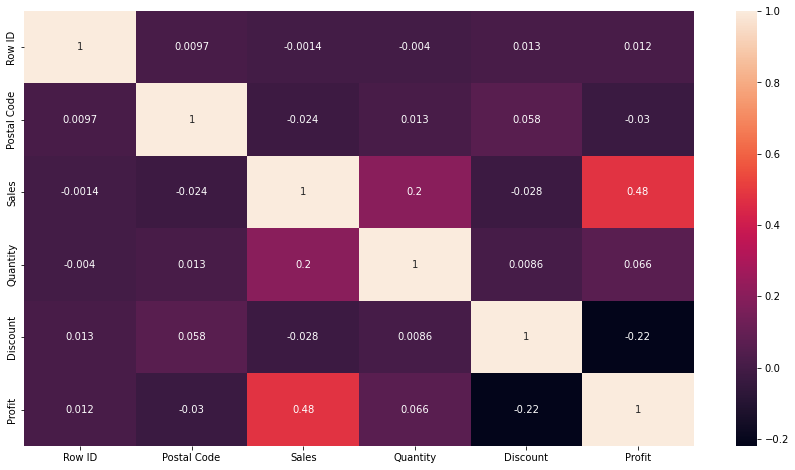

In [80]:
plt.figure(figsize=(15,8))
sns.heatmap(df.corr(),annot=True)
plt.show()

#### Profit and quantity are highly related with our target variable i.e. sales

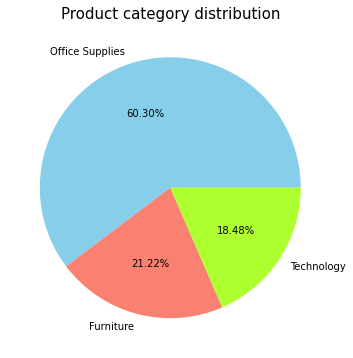

In [83]:
plt.figure(figsize=(15,6))
percentage = df['Category'].value_counts()         
labels = df['Category'].value_counts().index
color = ['skyblue','salmon','greenyellow']
plt.pie(percentage,labels = labels, autopct= "%0.2f%%",colors=color)
plt.title('Product category distribution',fontsize=15)
plt.show()

### Interpretation 

- **The count of office supplies is 60.30% while for furniture it is 21.22%**

In [3]:
import plotly.express as px

In [4]:
px.box(df, x="Category", y="Sales",title="Category wise sale")

### Technology generates more sale followed by office supply

In [5]:
px.scatter(df, x="Sales", y="Category", animation_frame="State",color="Profit",hover_name="Sub-Category")

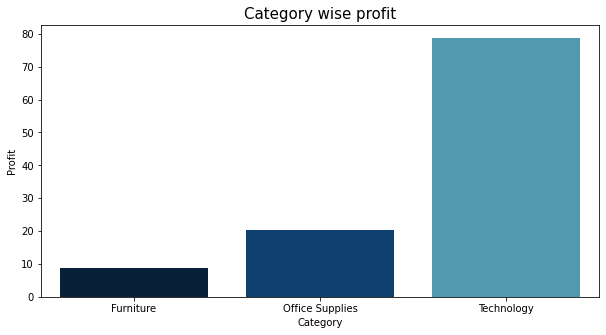

In [6]:
plt.figure(figsize=(10,5))
plt.title("Category wise profit",fontsize=15)
sns.barplot(x=df['Category'], y=df['Profit'],palette='ocean',ci=None)
plt.show()

#### Teachnology generates more profit than any category

In [84]:
furniture = df.loc[df['Category'] == 'Furniture']

In [85]:
#Since we are forecasting furniture and their sales
furniture = df.groupby('Order Date')['Sales'].sum().reset_index();furniture

,Order Date,Sales
0,2014-01-03,16.4480
1,2014-01-04,288.0600
2,2014-01-05,19.5360
3,2014-01-06,4407.1000
4,2014-01-07,87.1580
...,...,...
1232,2017-12-26,814.5940
1233,2017-12-27,177.6360
1234,2017-12-28,1657.3508
1235,2017-12-29,2915.5340


In [86]:
#getting the minimum and maximum order date for furniture
furniture['Order Date'].min(), furniture['Order Date'].max()

(Timestamp('2014-01-03 00:00:00'), Timestamp('2017-12-30 00:00:00'))

In [87]:
#setting order date as index since working with time series
furniture = furniture.set_index("Order Date");furniture

,Sales
Order Date,
2014-01-03,16.4480
2014-01-04,288.0600
2014-01-05,19.5360
2014-01-06,4407.1000
2014-01-07,87.1580
...,...
2017-12-26,814.5940
2017-12-27,177.6360
2017-12-28,1657.3508


#### Visualizing for weekly data

In [88]:
weekly_data= furniture.resample('W').mean() #resampling data as weekly

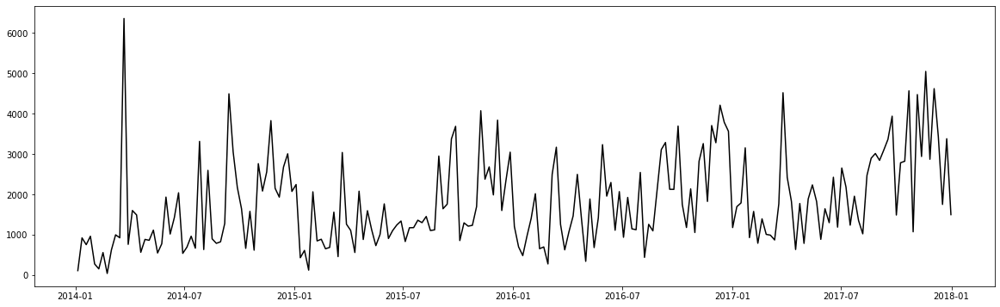

In [89]:
plt.figure(figsize=(20,6))
plt.plot(weekly_data,c='k',label='Furniture')
plt.show()

#### Interpretation:-
Our data starts from 2014 and ends at 2018.
Here we can observe seasonality patterns.The sales are low at the begninning of the year and high at the end of the year

#### Vizualising for Monthly data

In [90]:
monthly_data = furniture.resample("M").mean() #resampling data as monthly

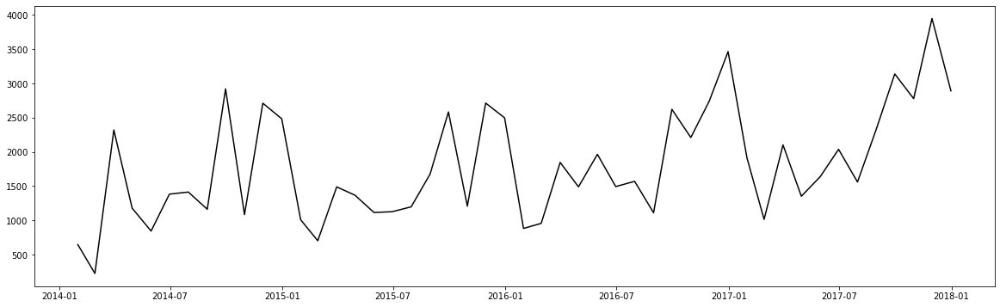

In [91]:
plt.figure(figsize=(20,6))
plt.plot(monthly_data,c='k',label='Furniture')
plt.show()

#### The data is smooth for both weekly and monthly data we proceed to do decomposition 

#### Decomposing with weekly data as we will get more data to train and predict 

In [92]:
from statsmodels.tsa.seasonal import seasonal_decompose

In [93]:
decomp = seasonal_decompose(weekly_data,period = 52)

In [94]:
d_trend = decomp.trend
d_seasonal = decomp.seasonal
d_residual = decomp.resid 

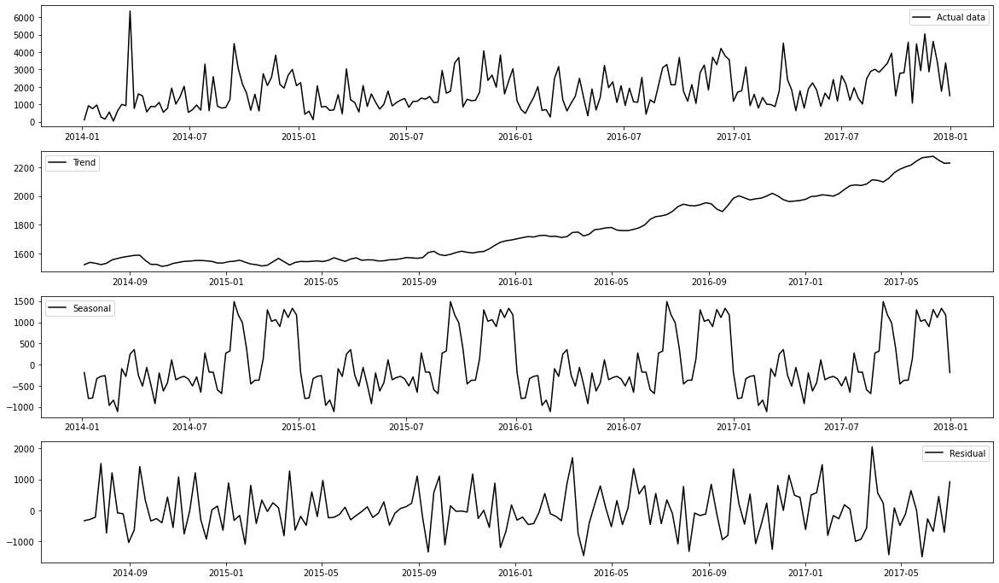

In [95]:
fig,ax = plt.subplots(4,1,figsize=(20,12))

plt.subplot(411)
plt.plot(weekly_data,label='Actual data',color='k')
plt.legend(loc='best')

plt.subplot(412)
plt.plot(d_trend,label='Trend',color='k')
plt.legend(loc='best')

plt.subplot(413)
plt.plot(d_seasonal,label='Seasonal',color='k')
plt.legend(loc='best')

plt.subplot(414)
plt.plot(d_residual,label='Residual',color='k')
plt.legend(loc='best')

plt.show()

### Interpretation

- **We can see a rising trend from January 2016**

- **There is seasonality in the sales of furniture through out the years**

### Checking the stationarity of the model

In [96]:
from statsmodels.tsa.stattools import adfuller

In [97]:
def checkstationarity(data):
    pvalue=adfuller(data)[1] #[1] gives the pvalue from adfuller
    if pvalue< 0.05:
        ret='Data is stationary. Model building can be done'
    else:
        ret='Data is not stationary. Model building can not be done'
    return(ret)

In [98]:
checkstationarity(furniture)

'Data is stationary. Model building can be done'

### Plotting ACF and PACF graphs

In [99]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf 

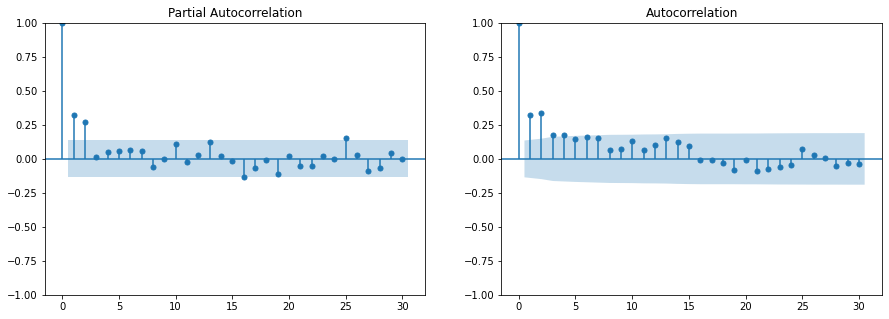

In [100]:
fig,ax=plt.subplots(1,2,figsize=(15,5))
plot_pacf(weekly_data ,lags=30,ax=ax[0]);
plot_acf(weekly_data,lags=30,ax = ax[1]);

- **P from(pcaf) = 3**
- **Q from(acf)  =4**

### Spliting the data into 80:20 ratio

In [101]:
split = int(0.8 * len(weekly_data))
train = weekly_data.Sales.iloc[:split] 
test =  weekly_data.Sales.iloc[split:] 
print("Train shape = {}, Test shape= {}".format(len(train), len(test))) 

Train shape = 167, Test shape= 42


# <div style = 'background-color:mistyrose'> <center> <font color='darkred'>**ARMA Model**</font>

In [102]:
from statsmodels.tsa.arima.model import ARIMA

In [103]:
#loop for p and q range (Creating an input for the model)
list=[]
for p in range(3):
    for q in range(4):
        list.append((p,0,q))

In [104]:
list

[(0, 0, 0),
 (0, 0, 1),
 (0, 0, 2),
 (0, 0, 3),
 (1, 0, 0),
 (1, 0, 1),
 (1, 0, 2),
 (1, 0, 3),
 (2, 0, 0),
 (2, 0, 1),
 (2, 0, 2),
 (2, 0, 3)]

In [105]:
#loop for models
models=[]
for i in list:
    m=ARIMA(train,order=i).fit()       ## building multiple models on each order in list based on train data
    models.append(m)

In [106]:
from sklearn.metrics import mean_squared_error #for calculating errors
## use for loop for calculating errors and other values for each model and append them in a list.

aic = [] 
bic = []  
MSE = [] 
RMSE = [] 

for i in models:
    aic.append(i.aic) #appending aic
    bic.append(i.bic) #appending bic 
    forecast = i.fittedvalues #forecasting predictions
    mse = mean_squared_error(train, forecast) #calculating mse
    rmse= mean_squared_error(train, forecast,squared= False)#calculating rmse
    MSE.append(mse) #appending mse
    RMSE.append(rmse) #appending rmse

In [107]:
error= pd.DataFrame({'AIC':aic,'BIC':bic,'MSE':MSE,'RMSE':RMSE},index = list) 
error

,AIC,BIC,MSE,RMSE
"(0, 0, 0)",2800.765356,2807.001343,1.098233e+06,1047.966160
"(0, 0, 1)",2792.863996,2802.217978,1.035172e+06,1017.434220
"(0, 0, 2)",2786.361981,2798.833956,9.840486e+05,991.992234
"(0, 0, 3)",2786.603217,2802.193186,9.739623e+05,986.895297
"(1, 0, 0)",2788.625806,2797.979787,1.009677e+06,1004.826669
"(1, 0, 1)",2785.245541,2797.717517,9.776655e+05,988.769675
"(1, 0, 2)",2786.628631,2802.218601,9.741104e+05,986.970330
"(1, 0, 3)",2787.803470,2806.511433,9.693439e+05,984.552645
"(2, 0, 0)",2784.536979,2797.008954,9.736383e+05,986.731136
"(2, 0, 1)",2786.507466,2802.097435,9.734245e+05,986.622751


In [108]:
value = error['RMSE'].sort_values() ## We will evaluate best model based on RMSE values.
value 

(2, 0, 3)     984.376289
(1, 0, 3)     984.552645
(2, 0, 2)     986.621490
(2, 0, 1)     986.622751
(2, 0, 0)     986.731136
(0, 0, 3)     986.895297
(1, 0, 2)     986.970330
(1, 0, 1)     988.769675
(0, 0, 2)     991.992234
(1, 0, 0)    1004.826669
(0, 0, 1)    1017.434220
(0, 0, 0)    1047.966160
Name: RMSE, dtype: float64

- **since (2,0,3) has minimum error we will make our arma model with p=2 and q=3**

In [109]:
p=2
q=3
ARMA = ARIMA(train,order=(p,0,q)).fit()
ARMA.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                  Sales   No. Observations:                  167
Model:                 ARIMA(2, 0, 3)   Log Likelihood               -1387.870
Date:                Mon, 14 Nov 2022   AIC                           2789.740
Time:                        01:23:29   BIC                           2811.566
Sample:                    01-05-2014   HQIC                          2798.599
                         - 03-12-2017                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       1623.8776    199.655      8.133      0.000    1232.560    2015.195
ar.L1          0.9643      1.109      0.870      0.385      -1.209       3.138
ar.L2         -0.0978      0.775     -0.126      0.900      -1.617       1.421
ma.L1         -0.7378      1.102     -0.670      0.503      -2.897       1.421
ma.L2          0.1280      0.530      0.242      0.809      -0.910       1.166
ma.L3         -0.1190      0.149     -0.801      0.423      -0.410       0.172
sigma2      9.674e+05   1.02e+05      9.526      0.000    7.68e+05    1.17e+06
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):               147.58
Prob(Q):                              0.98   Prob(JB):                         0.00
Heteroskedasticity (H):               0.68   Skew:                             1.42
Prob(H) (two-sided):                  0.15   Kurtosis:                         6.63
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [110]:
import statsmodels.api as sm #for checking model goodness
pvalue = sm.stats.acorr_ljungbox(ARMA.resid,lags=[30],return_df=True)['lb_pvalue'].values 

if pvalue < 0.05:
    print('It is not a Good Model')
else :
    print('It is a Good Model')

It is a Good Model


In [111]:
# predictions
foretrain_ARMA = ARMA.fittedvalues #predictions are found here by using model.fitted values
foretrain_ARMA 

Order Date
2014-01-05    1623.877576
2014-01-12    1186.627924
2014-01-19    1154.899812
2014-01-26    1271.980841
2014-02-02    1277.454367
                 ...     
2017-02-12    1541.858175
2017-02-19    1487.377912
2017-02-26    1490.071121
2017-03-05    1485.778009
2017-03-12    1387.619226
Freq: W-SUN, Length: 167, dtype: float64

In [112]:
forecast_ARMA = ARMA.forecast(len(test)) #prediction of the test data
forecast_ARMA

2017-03-19    1334.374053
2017-03-26    1411.483857
2017-04-02    1509.161534
2017-04-09    1534.036051
2017-04-16    1548.466077
2017-04-23    1559.947410
2017-04-30    1569.607172
2017-05-07    1577.798867
2017-05-14    1584.753112
2017-05-21    1590.657703
2017-05-28    1595.671170
2017-06-04    1599.928015
2017-06-11    1603.542427
2017-06-18    1606.611360
2017-06-25    1609.217137
2017-07-02    1611.429656
2017-07-09    1613.308267
2017-07-16    1614.903363
2017-07-23    1616.257730
2017-07-30    1617.407699
2017-08-06    1618.384118
2017-08-13    1619.213178
2017-08-20    1619.917118
2017-08-27    1620.514821
2017-09-03    1621.022320
2017-09-10    1621.453229
2017-09-17    1621.819105
2017-09-24    1622.129765
2017-10-01    1622.393540
2017-10-08    1622.617508
2017-10-15    1622.807674
2017-10-22    1622.969141
2017-10-29    1623.106240
2017-11-05    1623.222648
2017-11-12    1623.321488
2017-11-19    1623.405412
2017-11-26    1623.476670
2017-12-03    1623.537173
2017-12-10  

In [113]:
from sklearn.metrics import mean_squared_error #for calculating errors

In [114]:
aic_ARMA = ARMA.aic 
bic_ARMA = ARMA.bic
MSE_ARMA = mean_squared_error(test, forecast_ARMA)
RMSE_ARMA = mean_squared_error(test, forecast_ARMA,squared = False)

In [115]:
print("AIC =",aic_ARMA)
print("BIC =",bic_ARMA)
print("MSE =",MSE_ARMA)
print("RMSE =",RMSE_ARMA)

AIC = 2789.7402754975647
BIC = 2811.566232184482
MSE = 1977921.3681277374
RMSE = 1406.3859243208237


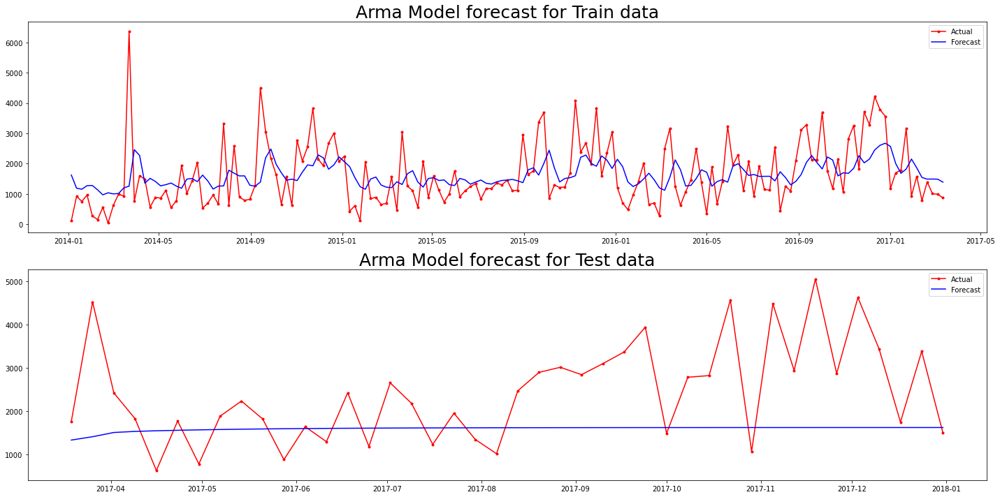

In [116]:
plt.figure(figsize=(20,10))

plt.subplot(2,1,1)
plt.title('Arma Model forecast for Train data',fontsize=25)
plt.plot(train,marker = '.', color = 'red' , label = 'Actual')
plt.plot(foretrain_ARMA ,color = 'blue' , label = 'Forecast' )
plt.legend()

plt.subplot(2,1,2)
plt.title('Arma Model forecast for Test data',fontsize=25)
plt.plot(test,marker = '.', color = 'red' , label = 'Actual')
plt.plot(forecast_ARMA,color = 'blue' , label = 'Forecast' )
plt.legend()
plt.tight_layout()
plt.show()

### Interpretation

- The actual and the forecast value vary alot for test data

# <div style = 'background-color:mistyrose'> <center> <font color='darkred'>**SARIMA Model**</font>

In [117]:
from statsmodels.tsa.statespace.sarimax import SARIMAX
import statsmodels.api as sm
from pandas.tseries.offsets import DateOffset

In [118]:
p=2; q=3; d=1
sarima = sm.tsa.statespace.SARIMAX(train,order=(p,d,q),seasonal_order=(p,d,q,30)).fit()
sarima.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                              Sales   No. Observations:                  167
Model:             SARIMAX(2, 1, 3)x(2, 1, 3, 30)   Log Likelihood               -1152.185
Date:                            Mon, 14 Nov 2022   AIC                           2326.369
Time:                                    01:24:19   BIC                           2358.408
Sample:                                01-05-2014   HQIC                          2339.389
                                     - 03-12-2017                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.4760      0.609      0.781      0.435      -0.718       1.670
ar.L2         -0.5579      0.487     -1.145      0.252      -1.512       0.397
ma.L1         -1.1252      0.562     -2.003      0.045      -2.226      -0.024
ma.L2          0.8519      0.721      1.181      0.238      -0.562       2.266
ma.L3         -0.5266      0.308     -1.710      0.087      -1.130       0.077
ar.S.L30       0.0441     10.223      0.004      0.997     -19.993      20.081
ar.S.L60      -0.0075     11.520     -0.001      0.999     -22.586      22.570
ma.S.L30      -0.7493     10.101     -0.074      0.941     -20.547      19.049
ma.S.L60       0.0079      4.731      0.002      0.999      -9.265       9.281
ma.S.L90       0.1246      9.236      0.013      0.989     -17.979      18.228
sigma2      1.736e+06   3.63e+05      4.777      0.000    1.02e+06    2.45e+06
===================================================================================
Ljung-Box (L1) (Q):                   0.01   Jarque-Bera (JB):                 0.25
Prob(Q):                              0.90   Prob(JB):                         0.88
Heteroskedasticity (H):               0.87   Skew:                            -0.08
Prob(H) (two-sided):                  0.65   Kurtosis:                         3.12
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [119]:
pvalue = sm.stats.acorr_ljungbox(sarima.resid,lags=[30],return_df=True)['lb_pvalue'].values 

if pvalue < 0.05:
    print('It is not a Good Model')
else :
    print('It is a Good Model')

It is a Good Model


In [120]:
foretrain_sarima = sarima.fittedvalues #predictions of the train data
foretrain_sarima

Order Date
2014-01-05       0.000000
2014-01-12      77.774831
2014-01-19     620.755177
2014-01-26     715.508328
2014-02-02     775.906816
                 ...     
2017-02-12    1176.218450
2017-02-19    2024.863539
2017-02-26    2008.741271
2017-03-05    1126.519867
2017-03-12    1475.649722
Freq: W-SUN, Length: 167, dtype: float64

In [121]:
sarima_forecast = sarima.forecast(len(test))
sarima_forecast

2017-03-19    1120.356311
2017-03-26    1450.398201
2017-04-02    2124.450319
2017-04-09    2008.229767
2017-04-16    1615.108288
2017-04-23    1438.217650
2017-04-30    2112.142380
2017-05-07    1675.019570
2017-05-14     962.827134
2017-05-21    1913.742474
2017-05-28    1157.093843
2017-06-04    1763.959626
2017-06-11    2702.979577
2017-06-18    1927.000055
2017-06-25    1886.080805
2017-07-02    1822.812537
2017-07-09    2259.263456
2017-07-16    1980.215554
2017-07-23    2369.678438
2017-07-30    2264.629435
2017-08-06    2129.157338
2017-08-13    1781.235140
2017-08-20    2247.498341
2017-08-27    1712.148087
2017-09-03    1666.656737
2017-09-10    1292.012568
2017-09-17    1977.570162
2017-09-24    1439.628343
2017-10-01     975.190357
2017-10-08    1170.005722
2017-10-15    1209.442508
2017-10-22    1510.764525
2017-10-29    2148.188244
2017-11-05    1824.916252
2017-11-12    1494.577388
2017-11-19    1311.955931
2017-11-26    2243.514962
2017-12-03    1926.656970
2017-12-10  

In [122]:
aic_sarima = sarima.aic 
bic_sarima = sarima.bic
MSE_sarima = mean_squared_error(test, sarima_forecast)
RMSE_sarima = mean_squared_error(test, sarima_forecast,squared = False)

In [123]:
print("AIC =",aic_sarima)
print("BIC =",bic_sarima)
print("MSE =",MSE_sarima)
print("RMSE =",RMSE_sarima)

AIC = 2326.3692884258835
BIC = 2358.40849216898
MSE = 2227817.277677817
RMSE = 1492.5874438966102


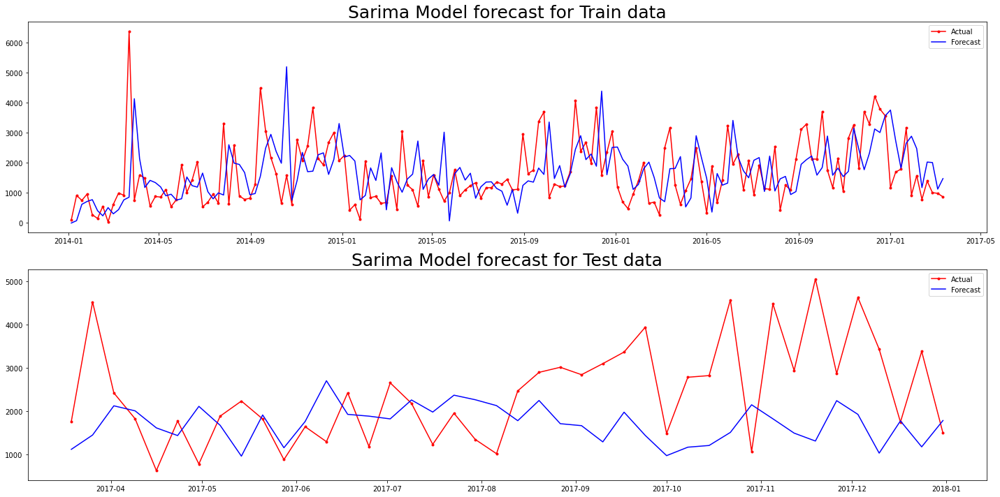

In [124]:
plt.figure(figsize=(20,10))

plt.subplot(2,1,1)
plt.title('Sarima Model forecast for Train data',fontsize=25)
plt.plot(train,marker = '.', color = 'red' , label = 'Actual')
plt.plot(foretrain_sarima ,color = 'blue' , label = 'Forecast' )
plt.legend()

plt.subplot(2,1,2)
plt.title('Sarima Model forecast for Test data',fontsize=25)
plt.plot(test,marker = '.', color = 'red' , label = 'Actual')
plt.plot(sarima_forecast,color = 'blue', label = 'Forecast' )
plt.legend()

plt.tight_layout()
plt.show()

#### Since there is seasonality present in the data set sarima model is predict better than arma model

# <div style = 'background-color:mistyrose'> <center> <font color='darkred'>**SARIMAX Model**</font>

In [125]:
furniture = df.loc[df['Category'] == 'Furniture']

In [126]:
furniture = furniture.set_index("Order Date")

In [127]:
fur_sarimax = furniture.groupby(['Order Date'])["Discount","Sales"].sum()
fur_sarimax.head()

,Discount,Sales
Order Date,,
2014-01-06,0.00,2573.820
2014-01-07,0.60,76.728
2014-01-10,0.00,51.940
2014-01-11,0.00,9.940
2014-01-13,0.15,879.939


In [128]:
weekly_data1 = fur_sarimax.resample("W").mean();weekly_data1

,Discount,Sales
Order Date,,
2014-01-12,0.150000,678.107000
2014-01-19,0.387500,312.618250
2014-01-26,0.066667,551.986000
2014-02-02,0.175000,311.833000
2014-02-09,0.000000,14.560000
...,...,...
2017-12-03,0.871429,2286.881714
2017-12-10,0.566667,1465.734000
2017-12-17,0.808333,773.303167


In [129]:
split = int(0.8*len(weekly_data1))
train = weekly_data1.iloc[:split]
test = weekly_data1.iloc[split:]
print("train = {}, test = {}".format(len(train),len(test)))

train = 166, test = 42


In [130]:
sarimax = SARIMAX(train.Sales,order=(2,0,3),seasonal_order=(1,0,1,52),exog=train.values).fit()

In [131]:
pvalue = sm.stats.acorr_ljungbox(sarimax.resid,lags=[1],return_df=True)['lb_pvalue'].values 

if pvalue < 0.05:
    print('It is not a Good Model')
else :
    print('It is a Good Model')

It is a Good Model


In [132]:
fortrain_sarimax = sarimax.fittedvalues #predictions of the train data
fortrain_sarimax

Order Date
2014-01-12    678.107000
2014-01-19    312.618250
2014-01-26    551.986000
2014-02-02    311.833000
2014-02-09     14.560000
                 ...    
2017-02-12    485.136250
2017-02-19    679.005100
2017-02-26    630.244000
2017-03-05    432.154667
2017-03-12    412.476667
Freq: W-SUN, Length: 166, dtype: float64

In [133]:
sarimax_forecast = sarimax.forecast(len(test), exog=test.values)
sarimax_forecast

2017-03-19     237.911500
2017-03-26     804.551333
2017-04-02     641.078800
2017-04-09     591.719500
2017-04-16     260.010600
2017-04-23     532.072400
2017-04-30     412.901720
2017-05-07    1080.547400
2017-05-14     475.717500
2017-05-21     863.085200
2017-05-28     336.820600
2017-06-04     637.919280
2017-06-11     520.978800
2017-06-18     935.810583
2017-06-25     706.844600
2017-07-02    1151.225550
2017-07-09     467.973667
2017-07-16     592.710200
2017-07-23     888.447400
2017-07-30     390.608000
2017-08-06     168.477333
2017-08-13     667.671500
2017-08-20    1864.263333
2017-08-27     809.098000
2017-09-03     983.373500
2017-09-10    1207.765000
2017-09-17    1436.757000
2017-09-24    1415.686667
2017-10-01     477.915200
2017-10-08     659.944000
2017-10-15    1125.582500
2017-10-22    1151.519840
2017-10-29     578.369600
2017-11-05    1428.473333
2017-11-12     902.652286
2017-11-19    1029.662143
2017-11-26    1152.482667
2017-12-03    2286.881714
2017-12-10  

In [134]:
aic_sarimax = sarimax.aic 
bic_sarimax = sarimax.bic
MSE_sarimax = mean_squared_error(test["Sales"], sarimax_forecast)
RMSE_sarimax = mean_squared_error(test["Sales"], sarimax_forecast,squared = False)

In [135]:
print("AIC =",aic_sarimax)
print("BIC =",bic_sarimax)
print("MSE =",MSE_sarimax)
print("RMSE =",RMSE_sarimax)

AIC = -3496.2231339341515
BIC = -3465.103256050586
MSE = 2.2098924010031362e-26
RMSE = 1.486570684832422e-13


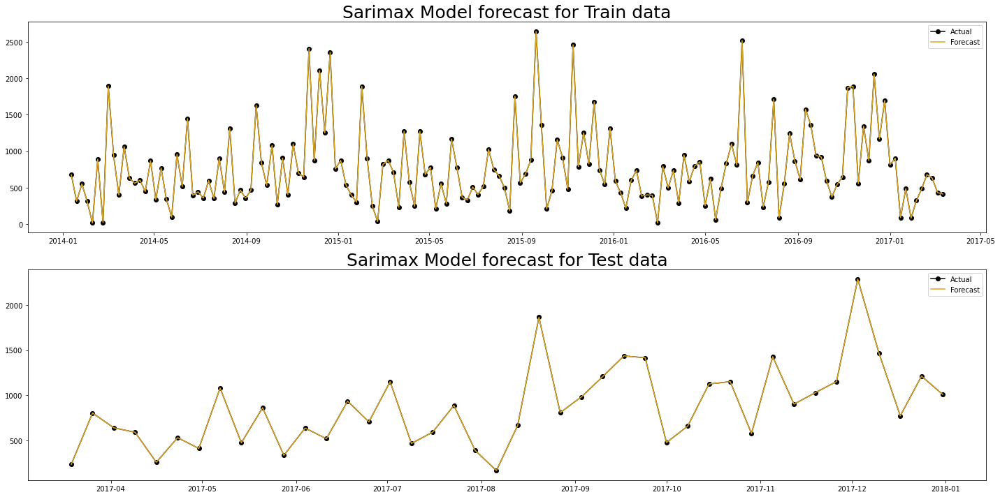

In [142]:
plt.figure(figsize=(20,10))

plt.subplot(2,1,1)
plt.title('Sarimax Model forecast for Train data',fontsize=25)
plt.plot(train['Sales'],marker = 'o', color = 'k' , label = 'Actual')
plt.plot(fortrain_sarimax ,color = 'goldenrod' , label = 'Forecast' )
plt.legend()

plt.subplot(2,1,2)
plt.title('Sarimax Model forecast for Test data',fontsize=25)
plt.plot(test['Sales'],marker = 'o', color = 'k' , label = 'Actual')
plt.plot(sarimax_forecast,color = 'goldenrod' , label = 'Forecast' )
plt.legend()

plt.tight_layout()
plt.show()

# <div style = 'background-color:mistyrose'> <center> <font color='darkred'>**COMPARISON**</font>

In [137]:
compare = pd.DataFrame([[aic_ARMA,bic_ARMA,MSE_ARMA,RMSE_ARMA],
                      [aic_sarima,bic_sarima,MSE_sarima,RMSE_sarima],
                      [aic_sarimax,bic_sarimax,MSE_sarimax,RMSE_sarimax]],
                     columns=['AIC','BIC','MSE','RMSE'],index=['Arima Model','Sarima model','Sarimax Model'])

In [138]:
compare

,AIC,BIC,MSE,RMSE
Arima Model,2789.740275,2811.566232,1.977921e+06,1.406386e+03
Sarima model,2326.369288,2358.408492,2.227817e+06,1.492587e+03
Sarimax Model,-3496.223134,-3465.103256,2.209892e-26,1.486571e-13


# <center> Conclusions </center>
- **SARIMAX Model gives better results than compared to ARMA and SARIMA**
- **Predicted and actual values are very close to one another**
- **There is positive trend present in the furniture sales**
- **The sales of furniture are showing a positive trend.**
- **Chair products will see increased sales and profits.**